# DCGANを使用して、犬の画像だけを学習し、犬の画像を生成する

合格した某講座の修了課題なので、丸コピーは不合格になりますよ

In [1]:
import cv2
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image
import tensorflow as tf
from keras.datasets import cifar100

from tensorflow.keras.layers import Conv2DTranspose,Dense, Flatten, Reshape,UpSampling2D, Conv2D, BatchNormalization, Activation, Input, LeakyReLU,Dropout,ZeroPadding2D
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import UpSampling2D, Conv2D

from tensorflow.keras.initializers import RandomNormal, glorot_uniform, he_normal
import numpy as np
import os
import random
import time
from keras.datasets import cifar100

In [2]:
class ImageUtil:
    def __init__(self,image_size=32,save_path='report/temp/',image_path='OID2/'):
        self.save_path = save_path
        self.image_path = image_path
        self.image_size = image_size
        
        pass
    def loadAndConvertImage(self,image_filename):
        target_size=(self.image_size, self.image_size)
        
        # 画像ファイルを読み込む
        image = tf.io.read_file(image_filename)
    
        # jpg
        image = tf.image.decode_jpeg(image, channels=3)
        
    
        # 画像のサイズを変更
        image = tf.image.resize(image, target_size)
        # RGB画像をグレースケールに変換する
        #image = tf.image.rgb_to_grayscale(image)
        
        # 画像のピクセル値を正規化
        #0~2の正規化してから -1 で -1〜1の分布にする
        image = image / 127.5 - 1.0
    
        image = tf.cast(image, tf.float32)
    
        #image = tf.expand_dims(image, axis=0)
        
        return image
    def loadDataset(self):
        images = []
        
        # データセットのロードロジック
        for image_file in os.listdir(self.image_path):
            
            filename, ext = os.path.splitext(image_file)
            
            if ext != '.jpg':
                continue #画像でなければスキップ
            # 画像のロードと前処理
            images.append(self.loadAndConvertImage(self.image_path + image_file))
            
                
        return np.array(images)

    def loadCifar100(self,resize=False):
        (x_train, y_train), (_, _) = cifar100.load_data(label_mode='fine')
        dog_index = 97  # CIFAR-100でのDogカテゴリのインデックス
        x_train = x_train[y_train.flatten() == dog_index]
        x_train = (x_train - 127.5) / 127.5  # 画像を[-1, 1]の範囲に正規化
        
        if resize:
            x_train_resized = np.zeros((x_train.shape[0], self.image_size, self.image_size, 3))
            
            # 画像を拡大して新しい配列に格納
            for i in range(x_train.shape[0]):
                img = Image.fromarray((x_train[i] * 127.5 + 127.5).astype(np.uint8))  # 正規化を元に戻す
                img = img.resize((self.image_size,self.image_size), Image.BICUBIC)  # 拡大（Bicubic補間を使用）
                x_train_resized[i] = np.array(img) / 127.5 - 1.0  # 再度正規化
        
            x_train = x_train_resized
            
        return x_train

    #サンプル用
    def showImages(self,images):
        plt.figure(figsize=(10,10))
        for i in range(50):
            idx = np.random.randint(0,len(X_train))
            plt.subplot(10,10,i+1)
            plt.xticks([])
            plt.yticks([])
            plt.grid(False)
            plt.imshow((X_train[idx] * 127.5 + 127.5).astype(np.uint8),cmap=plt.cm.binary)
        
        plt.show()

    #学習途中観察用
    def plotResult(self):
        discriminator_losses = [v[0] for v in losses]
        generator_losses = [v[1] for v in losses]
    
        plt.figure(figsize=(10, 5))
        plt.plot(discriminator_losses, label="Discriminator Loss")
        plt.plot(generator_losses, label="Generator Loss")
        plt.title("Training Losses")
        plt.xlabel("Iterations")
        plt.ylabel("Loss")
        plt.legend()
        plt.show()

    def sampleImages(self,generator, z_dim,iteration,image_grid_rows=4, image_grid_columns=4):
        z = np.random.normal(0, 1, (image_grid_rows * image_grid_columns, z_dim))
        gen_imgs = generator.predict(z)
        gen_imgs = 0.5 * gen_imgs + 0.5
    
        fig, axs = plt.subplots(image_grid_rows, image_grid_columns, figsize=(4, 4), sharey=True, sharex=True)
        cnt = 0
        for i in range(image_grid_rows):
            for j in range(image_grid_columns):
                axs[i, j].imshow(gen_imgs[cnt, :, :,:], cmap=None)
                axs[i, j].axis('off')
                cnt += 1
        plt.savefig( f'{self.save_path}dcgan-images-iteration-{iteration}.png')
        plt.show()
        

モデルについてはこれを参考にしています
![Generatorイメージ](https://production-media.paperswithcode.com/methods/Screen_Shot_2020-07-01_at_11.27.51_PM_IoGbo1i.png)



In [3]:
class DCGAN:
    def __init__(self,image_size,dimension,dropout_rate=0.2):
        self.dimension = dimension
        self.cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
        self.image_size = image_size
        self.dropout_rate = dropout_rate
        
        self.generator_optimizer = tf.keras.optimizers.Adam(1e-4)
        self.discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

        self.generator = self.CreateGenerator()
        self.discriminator = self.CreateDiscriminator()

        self.load_weights("./",500)
    def showSummary(self):
        self.generator.summary()
        self.discriminator.summary()

    def CreateGenerator(self):
        model = tf.keras.Sequential()
        model.add(Dense(4*4*1024, use_bias=False, input_shape=(self.dimension,)))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(0.2))
        model.add(Dropout(self.dropout_rate))
        
        model.add(Reshape((4, 4, 1024)))
        assert model.output_shape == (None, 4, 4, 1024)
    
        model.add(Conv2DTranspose(512, (5, 5), strides=(2, 2), padding='same', use_bias=False))
        assert model.output_shape == (None, 8, 8, 512)
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(0.2))
        model.add(Dropout(self.dropout_rate))
        
        model.add(Conv2DTranspose(256, (5, 5), strides=(2, 2), padding='same', use_bias=False))
        assert model.output_shape == (None, 16, 16, 256)
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(0.2))
        model.add(Dropout(self.dropout_rate))
        
        model.add(Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
        assert model.output_shape == (None, 32, 32, 128)
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(0.2))
        model.add(Dropout(self.dropout_rate))
        
        model.add(Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
        assert model.output_shape == (None, 64, 64, 3)
        
        return model
        
    
        
    #識別器
    def CreateDiscriminator(self):
        # model = tf.keras.Sequential()
        # model.add(Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[self.image_size, self.image_size, 3]))
        # model.add(LeakyReLU())
        # model.add(Dropout(dropout_rate))
        
        # model.add(Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
        # model.add(LeakyReLU())
        # model.add(Dropout(dropout_rate))
        
        # model.add(Flatten())
        # model.add(Dense(1))
    
        # return model

        model = Sequential()
    
        # 初期畳み込み層 (入力サイズ: 64x64)
        model.add(Conv2D(256, (5, 5), strides=(2, 2), padding='same', input_shape=[self.image_size, self.image_size, 3]))
        model.add(LeakyReLU(0.2))
        model.add(Dropout(0.4))
    
        # 追加の畳み込み層
        model.add(Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(0.2))
        model.add(Dropout(0.4))
    
        model.add(Conv2D(512, (5, 5), strides=(2, 2), padding='same'))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(0.2))
        model.add(Dropout(0.4))

        model.add(Conv2D(1024, (5, 5), strides=(2, 2), padding='same'))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(0.2))
        model.add(Dropout(0.4))
    
        # 出力層
        model.add(Flatten())
        #model.add(Dense(1, activation='sigmoid'))
        model.add(Dense(1)) #tf.keras.losses.BinaryCrossentropy(from_logits=True)を使うので！！
    
        return model
        
        
    #識別器の損失
    def discriminator_loss(self,real, fake):
        real_loss = self.cross_entropy(tf.ones_like(real), real)
        fake_loss = self.cross_entropy(tf.zeros_like(fake), fake)
        total_loss = real_loss + fake_loss
        return total_loss
        
    #生成器の損失
    def generator_loss(self,fake):
        return self.cross_entropy(tf.ones_like(fake), fake)

    def getWeightFileName(self,epoch):
        format = "dcgan_v2_{}_{}_{}_{}_weight.h5"
        g = format.format(self.image_size, self.dimension,epoch,"g")
        d = format.format(self.image_size, self.dimension,epoch,"d")

        return g,d
        
    #save weights
    def save_weights(self,path,epoch):
        
        g,d = self.getWeightFileName(epoch)
        
        self.generator.save_weights(path + g)
        self.discriminator.save_weights(path + d)
        
    #load weights
    def load_weights(self,path,lastEpoch):
        g,d = self.getWeightFileName(lastEpoch)
        
        self.generator.load_weights(path + g)
        self.discriminator.load_weights(path + d)
        
    def train_step(self,images,batch_size):
        noise = tf.random.normal([batch_size, self.dimension])
    
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            generated_images = self.generator(noise, training=True)
    
            real = self.discriminator(images, training=True)
            fake = self.discriminator(generated_images, training=True)
    
            gen_loss = self.generator_loss(fake)
            disc_loss = self.discriminator_loss(real, fake)
    
        gradients_of_generator = gen_tape.gradient(gen_loss, self.generator.trainable_variables)
        gradients_of_discriminator = disc_tape.gradient(disc_loss, self.discriminator.trainable_variables)
    
        self.generator_optimizer.apply_gradients(zip(gradients_of_generator, self.generator.trainable_variables))
        self.discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, self.discriminator.trainable_variables))
        
        #グラフ用
        #本物画像 識別器 正解率
        real_accuracy = tf.reduce_mean(tf.cast(tf.greater(real, 0), tf.float32))
        #偽物画像 識別器 正解率
        fake_accuracy = tf.reduce_mean(tf.cast(tf.less(fake, 0), tf.float32))
    
        return gen_loss, disc_loss, real_accuracy, fake_accuracy
        


(500, 64, 64, 3)


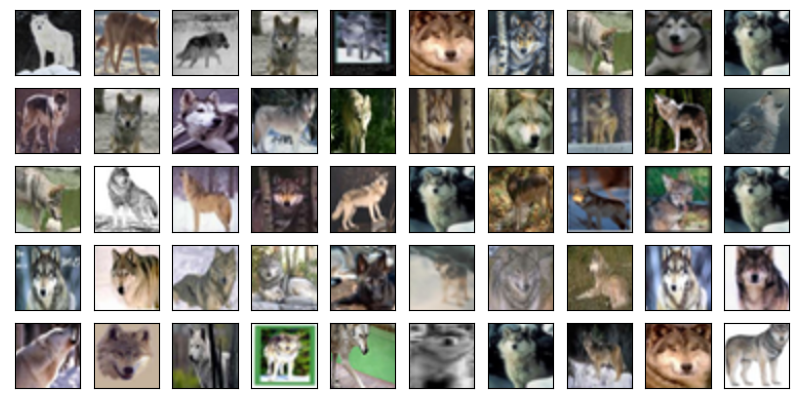

In [4]:
#main
if __name__ == "__main__":
    imageSize = 64
    zdim = 100 
    #画像サイズは６４で１００００回は一晩かかるので
    iu = ImageUtil(image_size=imageSize)
    X_train = iu.loadCifar100(True)
    print(X_train.shape)
    iu.showImages(X_train)



In [5]:
    gan = DCGAN(image_size=imageSize,dimension=zdim,dropout_rate=0.3) 
    gan.showSummary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16384)             1638400   
                                                                 
 batch_normalization (BatchN  (None, 16384)            65536     
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 16384)             0         
                                                                 
 dropout (Dropout)           (None, 16384)             0         
                                                                 
 reshape (Reshape)           (None, 4, 4, 1024)        0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 512)        13107200  
 nspose)                                                

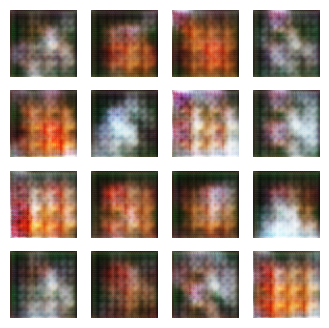

50 [D loss: 0.014871244318783283, real acc.: 100.0%] [G loss: 7.222275257110596, fake acc.: 100.0%]


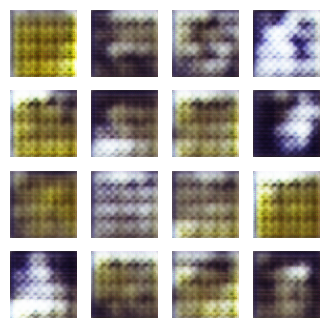

100 [D loss: 0.07418631762266159, real acc.: 96.15384674072266%] [G loss: 8.467182159423828, fake acc.: 100.0%]


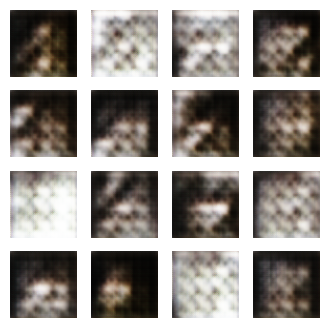

150 [D loss: 0.046884678304195404, real acc.: 96.15384674072266%] [G loss: 12.169717788696289, fake acc.: 100.0%]


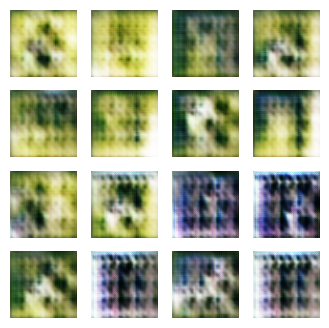

200 [D loss: 0.19962412118911743, real acc.: 100.0%] [G loss: 4.103652000427246, fake acc.: 93.75%]


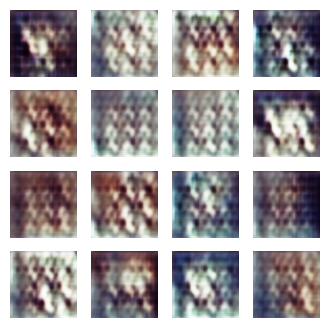

250 [D loss: 0.23871853947639465, real acc.: 90.38461303710938%] [G loss: 20.1689453125, fake acc.: 100.0%]


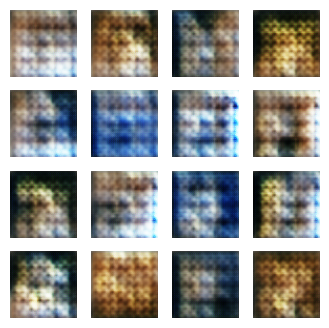

300 [D loss: 0.12190073728561401, real acc.: 100.0%] [G loss: 4.159900665283203, fake acc.: 95.3125%]


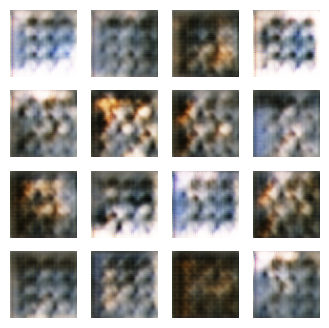

350 [D loss: 0.013476040214300156, real acc.: 100.0%] [G loss: 6.699474334716797, fake acc.: 100.0%]


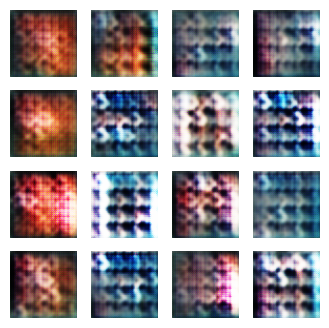

400 [D loss: 0.015309367328882217, real acc.: 100.0%] [G loss: 6.772416591644287, fake acc.: 100.0%]


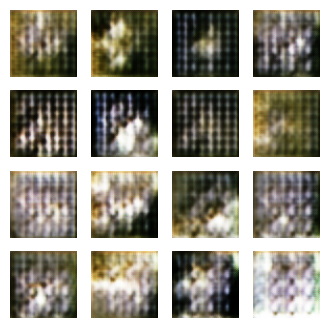

450 [D loss: 0.01694323867559433, real acc.: 100.0%] [G loss: 6.690953254699707, fake acc.: 100.0%]


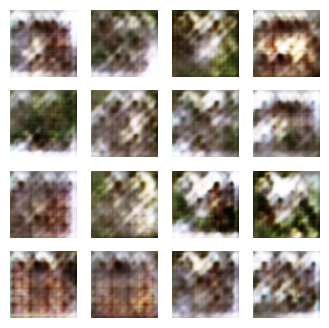

500 [D loss: 0.029145170003175735, real acc.: 100.0%] [G loss: 6.89082670211792, fake acc.: 100.0%]


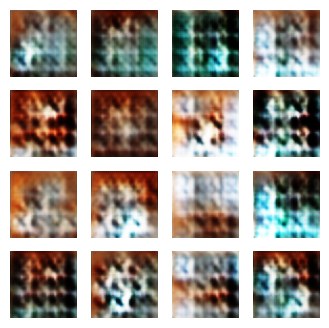

550 [D loss: 0.017012272030115128, real acc.: 100.0%] [G loss: 7.4140777587890625, fake acc.: 100.0%]


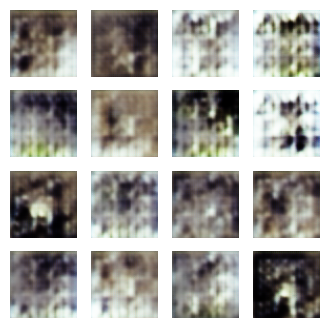

600 [D loss: 0.10433436930179596, real acc.: 100.0%] [G loss: 5.3966064453125, fake acc.: 95.3125%]


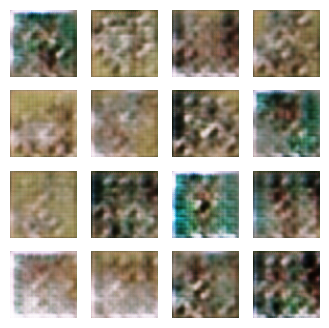

650 [D loss: 0.9525920152664185, real acc.: 67.30769348144531%] [G loss: 4.788251876831055, fake acc.: 96.875%]


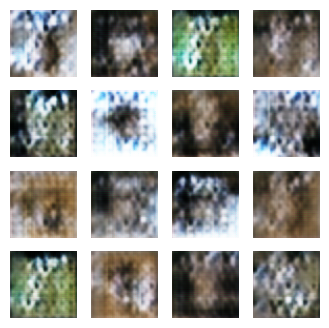

700 [D loss: 0.06839903444051743, real acc.: 96.15384674072266%] [G loss: 9.931907653808594, fake acc.: 100.0%]


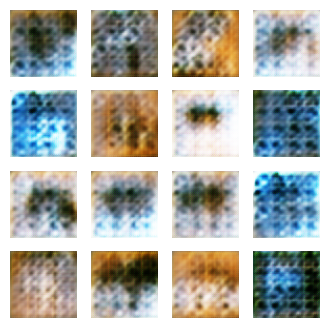

750 [D loss: 0.037858996540308, real acc.: 100.0%] [G loss: 5.750561714172363, fake acc.: 100.0%]


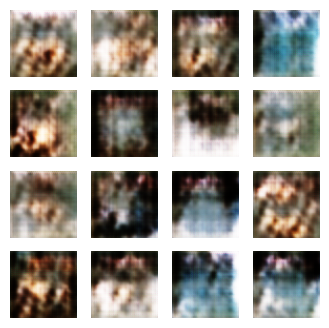

800 [D loss: 0.008558634668588638, real acc.: 100.0%] [G loss: 8.462749481201172, fake acc.: 100.0%]


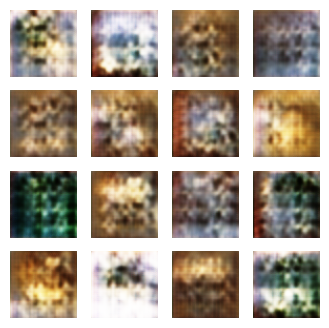

850 [D loss: 0.4351094663143158, real acc.: 100.0%] [G loss: 2.8108041286468506, fake acc.: 81.25%]


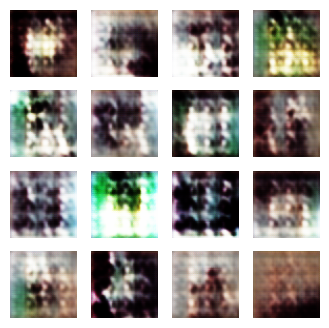

900 [D loss: 0.00846010260283947, real acc.: 100.0%] [G loss: 6.8975725173950195, fake acc.: 100.0%]


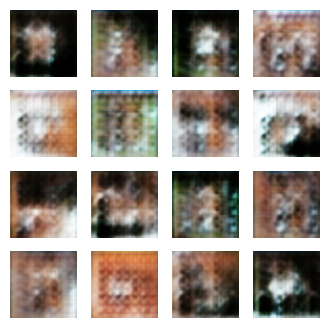

950 [D loss: 0.04314602166414261, real acc.: 98.07691955566406%] [G loss: 7.0878400802612305, fake acc.: 100.0%]


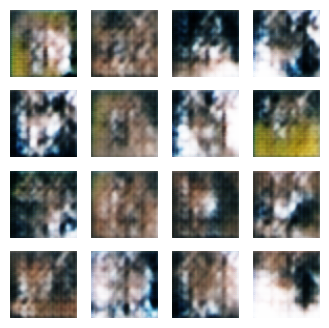

1000 [D loss: 0.0873921811580658, real acc.: 100.0%] [G loss: 6.0131025314331055, fake acc.: 95.3125%]


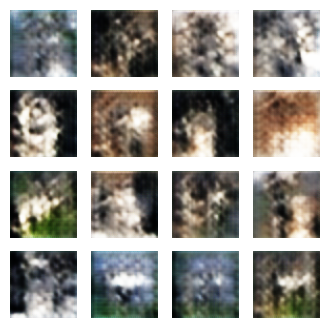

1050 [D loss: 0.0274821724742651, real acc.: 100.0%] [G loss: 10.371769905090332, fake acc.: 100.0%]


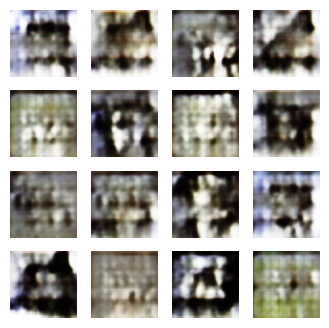

1100 [D loss: 0.01411774754524231, real acc.: 100.0%] [G loss: 8.594720840454102, fake acc.: 100.0%]


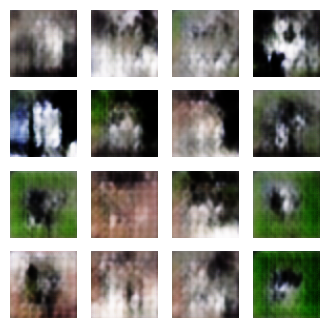

1150 [D loss: 0.16294626891613007, real acc.: 100.0%] [G loss: 5.4776434898376465, fake acc.: 93.75%]


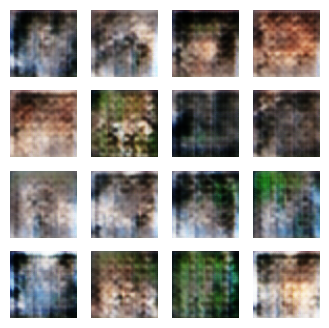

1200 [D loss: 0.0595061294734478, real acc.: 98.07691955566406%] [G loss: 12.252552032470703, fake acc.: 100.0%]


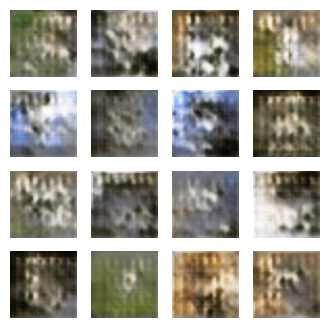

1250 [D loss: 0.00606305617839098, real acc.: 100.0%] [G loss: 8.241994857788086, fake acc.: 100.0%]


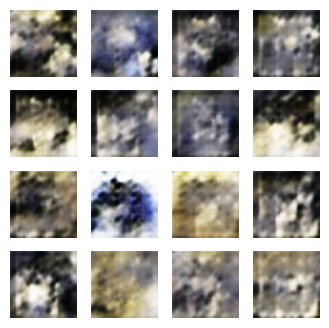

1300 [D loss: 0.03665933758020401, real acc.: 100.0%] [G loss: 6.977044582366943, fake acc.: 100.0%]


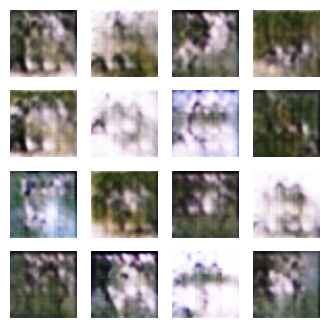

1350 [D loss: 0.013703353703022003, real acc.: 100.0%] [G loss: 11.740474700927734, fake acc.: 100.0%]


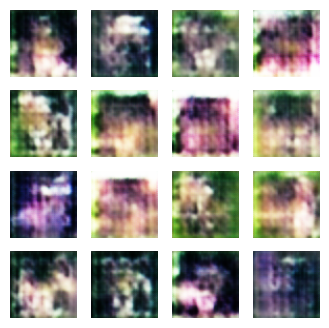

1400 [D loss: 0.03740307688713074, real acc.: 98.07691955566406%] [G loss: 7.679434299468994, fake acc.: 100.0%]


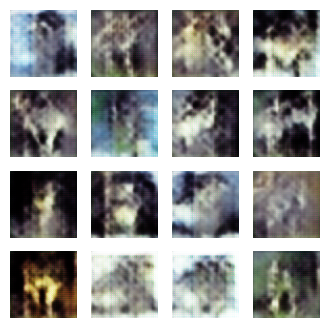

1450 [D loss: 0.018280841410160065, real acc.: 100.0%] [G loss: 8.52662181854248, fake acc.: 100.0%]


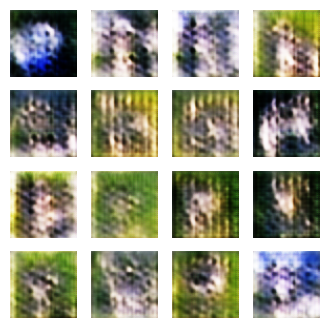

1500 [D loss: 0.04206003248691559, real acc.: 98.07691955566406%] [G loss: 13.544194221496582, fake acc.: 100.0%]


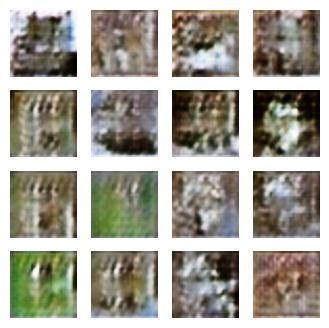

1550 [D loss: 0.06085524335503578, real acc.: 100.0%] [G loss: 9.787664413452148, fake acc.: 100.0%]


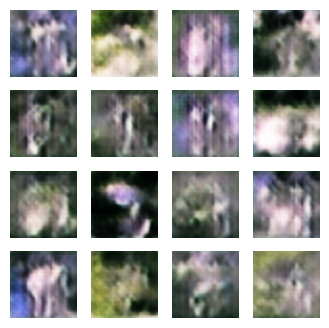

1600 [D loss: 0.15162013471126556, real acc.: 94.23077392578125%] [G loss: 15.693328857421875, fake acc.: 100.0%]


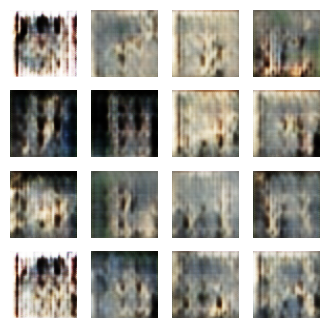

1650 [D loss: 0.0003219199716113508, real acc.: 100.0%] [G loss: 12.020732879638672, fake acc.: 100.0%]


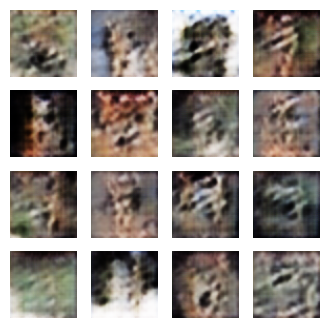

1700 [D loss: 0.06552685797214508, real acc.: 96.15384674072266%] [G loss: 9.197396278381348, fake acc.: 100.0%]


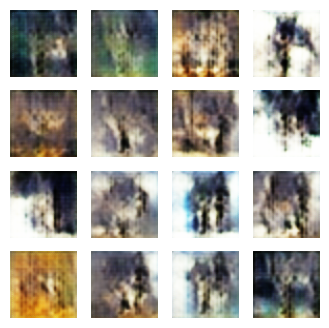

1750 [D loss: 0.020645130425691605, real acc.: 100.0%] [G loss: 10.555713653564453, fake acc.: 100.0%]


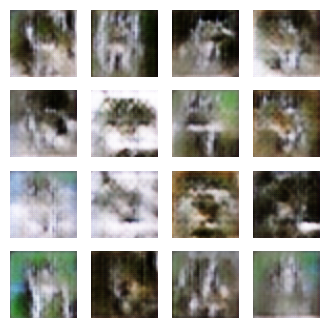

1800 [D loss: 0.10500145703554153, real acc.: 100.0%] [G loss: 4.892733097076416, fake acc.: 95.3125%]


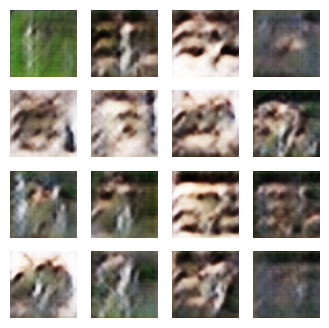

1850 [D loss: 0.04261472076177597, real acc.: 100.0%] [G loss: 15.648050308227539, fake acc.: 100.0%]


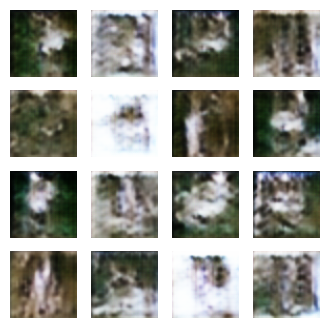

1900 [D loss: 0.037013400346040726, real acc.: 100.0%] [G loss: 6.850024223327637, fake acc.: 98.4375%]


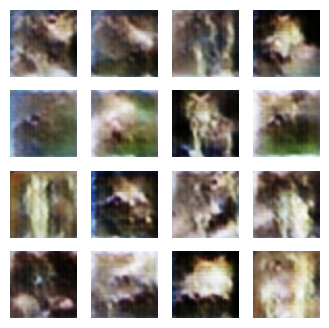

1950 [D loss: 0.005706564988940954, real acc.: 100.0%] [G loss: 9.13847541809082, fake acc.: 100.0%]


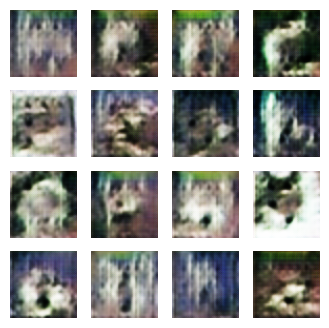

2000 [D loss: 0.019871283322572708, real acc.: 100.0%] [G loss: 8.146145820617676, fake acc.: 100.0%]


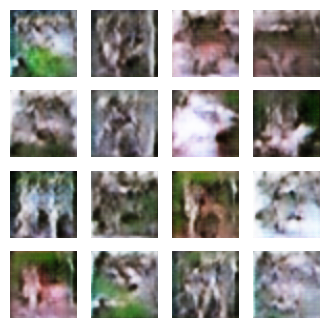

2050 [D loss: 0.004469899460673332, real acc.: 100.0%] [G loss: 10.560550689697266, fake acc.: 100.0%]


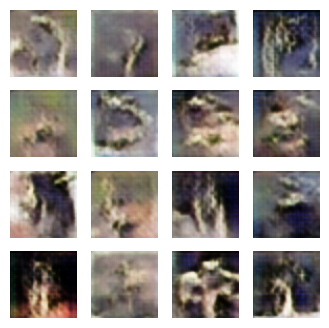

2100 [D loss: 0.32829907536506653, real acc.: 84.61538696289062%] [G loss: 10.077366828918457, fake acc.: 100.0%]


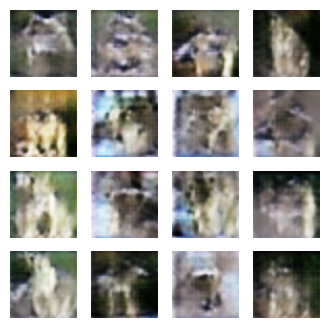

2150 [D loss: 0.12629206478595734, real acc.: 94.23077392578125%] [G loss: 9.489489555358887, fake acc.: 100.0%]


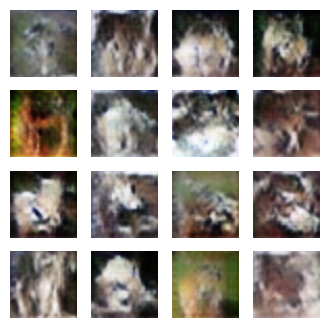

2200 [D loss: 0.053977664560079575, real acc.: 98.07691955566406%] [G loss: 10.499931335449219, fake acc.: 100.0%]


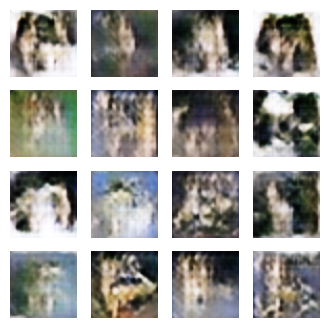

2250 [D loss: 0.006353162694722414, real acc.: 100.0%] [G loss: 8.615667343139648, fake acc.: 100.0%]


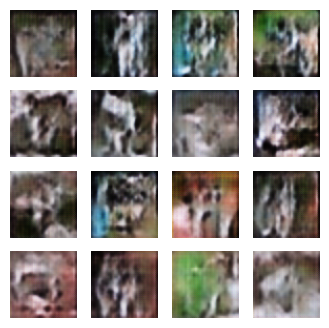

2300 [D loss: 0.020809508860111237, real acc.: 100.0%] [G loss: 9.408126831054688, fake acc.: 100.0%]


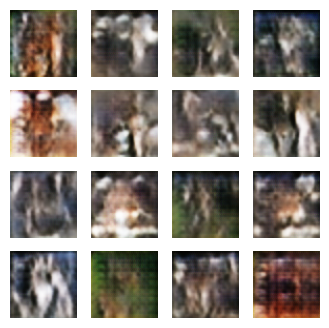

2350 [D loss: 0.0015293427277356386, real acc.: 100.0%] [G loss: 10.171073913574219, fake acc.: 100.0%]


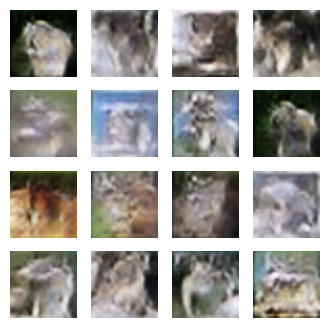

2400 [D loss: 0.025947358459234238, real acc.: 100.0%] [G loss: 10.303157806396484, fake acc.: 100.0%]


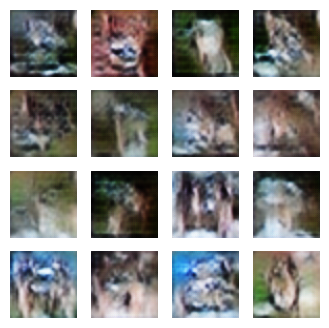

2450 [D loss: 0.0007391932886093855, real acc.: 100.0%] [G loss: 11.947603225708008, fake acc.: 100.0%]


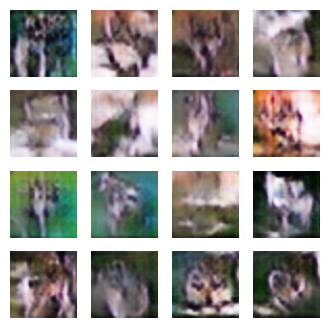

2500 [D loss: 0.09208860248327255, real acc.: 100.0%] [G loss: 10.371891021728516, fake acc.: 96.875%]


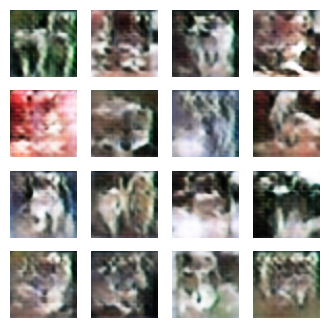

2550 [D loss: 0.08980683982372284, real acc.: 100.0%] [G loss: 6.075055122375488, fake acc.: 95.3125%]


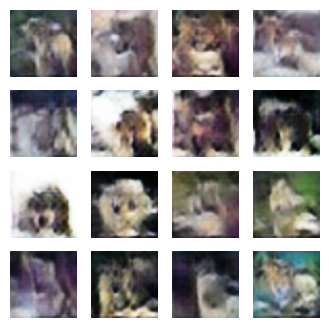

2600 [D loss: 0.007541154511272907, real acc.: 100.0%] [G loss: 8.098962783813477, fake acc.: 100.0%]


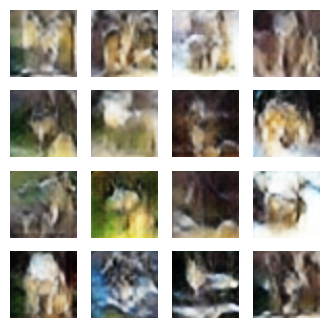

2650 [D loss: 0.023404929786920547, real acc.: 100.0%] [G loss: 7.898037910461426, fake acc.: 100.0%]


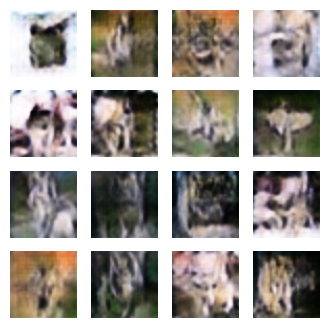

2700 [D loss: 0.17433129251003265, real acc.: 94.23077392578125%] [G loss: 10.060348510742188, fake acc.: 100.0%]


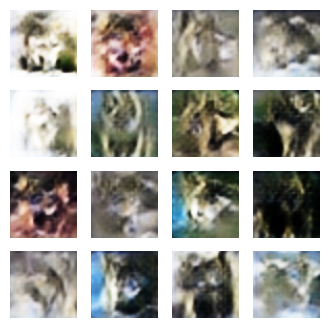

2750 [D loss: 0.054528553038835526, real acc.: 100.0%] [G loss: 7.472011566162109, fake acc.: 98.4375%]


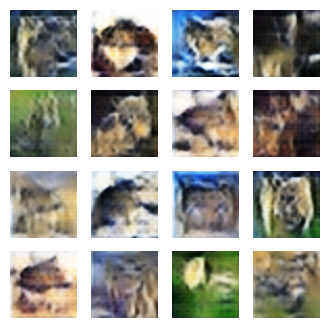

2800 [D loss: 0.00614702794700861, real acc.: 100.0%] [G loss: 9.335090637207031, fake acc.: 100.0%]


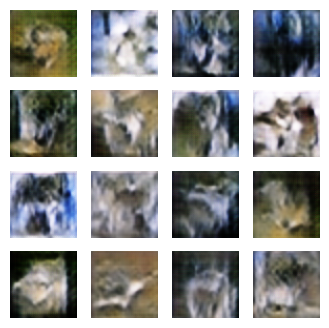

2850 [D loss: 0.025683457031846046, real acc.: 98.07691955566406%] [G loss: 11.469783782958984, fake acc.: 100.0%]


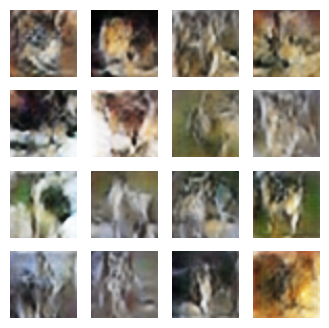

2900 [D loss: 0.023356016725301743, real acc.: 100.0%] [G loss: 7.8085856437683105, fake acc.: 98.4375%]


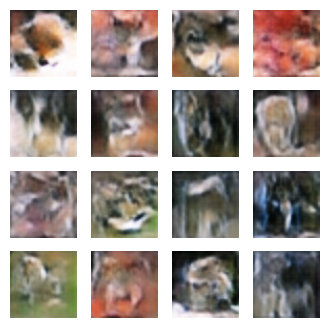

2950 [D loss: 0.005702358204871416, real acc.: 100.0%] [G loss: 10.150015830993652, fake acc.: 100.0%]


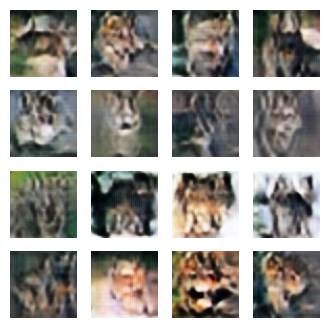

3000 [D loss: 0.10440746694803238, real acc.: 98.07691955566406%] [G loss: 16.382007598876953, fake acc.: 100.0%]


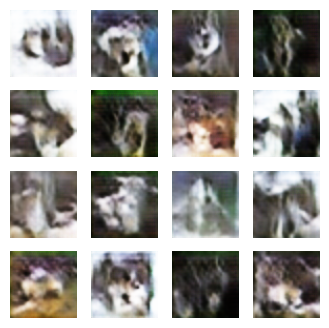

3050 [D loss: 0.022894607856869698, real acc.: 100.0%] [G loss: 8.01046085357666, fake acc.: 100.0%]


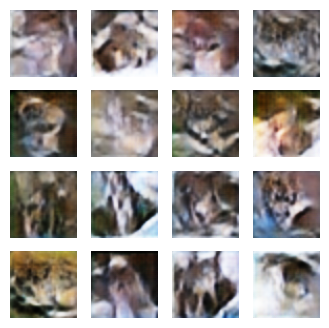

3100 [D loss: 0.006605332717299461, real acc.: 100.0%] [G loss: 11.12700366973877, fake acc.: 100.0%]


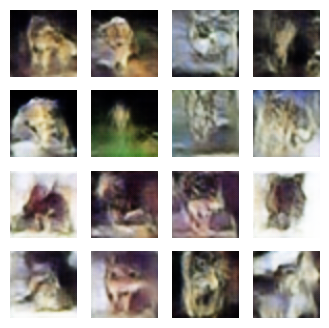

3150 [D loss: 0.007558146957308054, real acc.: 100.0%] [G loss: 13.593815803527832, fake acc.: 100.0%]


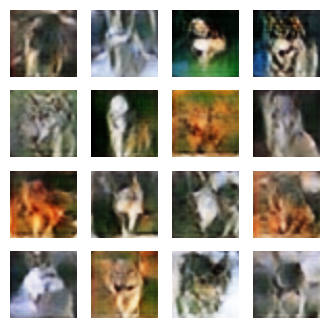

3200 [D loss: 0.007392745465040207, real acc.: 100.0%] [G loss: 13.391582489013672, fake acc.: 100.0%]


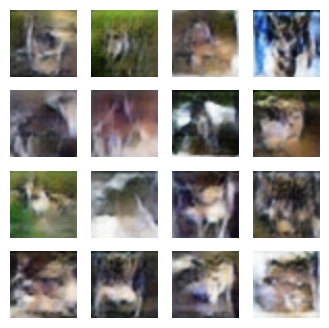

3250 [D loss: 0.01598532497882843, real acc.: 100.0%] [G loss: 10.04286003112793, fake acc.: 100.0%]


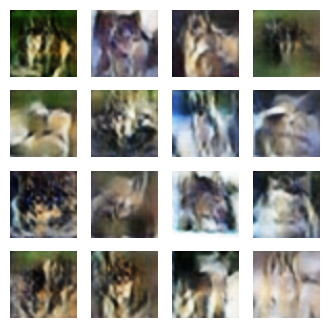

3300 [D loss: 0.012499364092946053, real acc.: 100.0%] [G loss: 10.361166000366211, fake acc.: 100.0%]


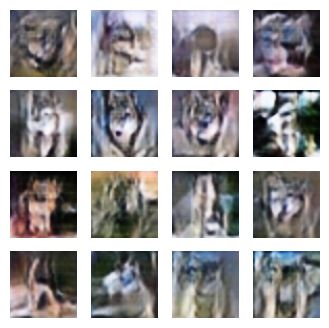

3350 [D loss: 0.06553426384925842, real acc.: 100.0%] [G loss: 9.454039573669434, fake acc.: 96.875%]


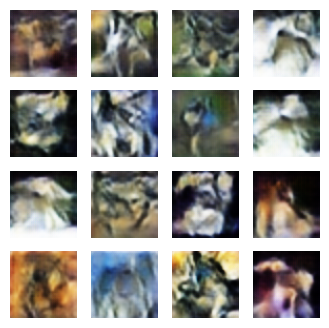

3400 [D loss: 0.001965285511687398, real acc.: 100.0%] [G loss: 11.322693824768066, fake acc.: 100.0%]


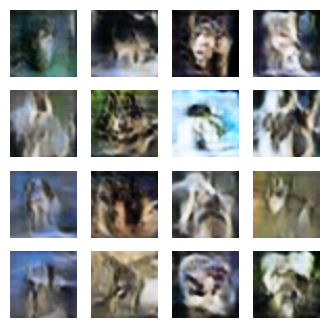

3450 [D loss: 0.016758816316723824, real acc.: 100.0%] [G loss: 9.31730842590332, fake acc.: 100.0%]


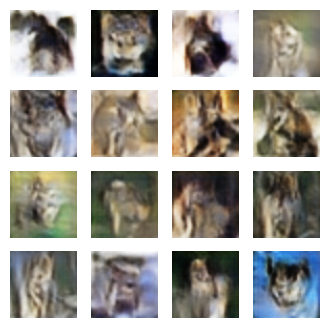

3500 [D loss: 0.0013831404503434896, real acc.: 100.0%] [G loss: 10.96839714050293, fake acc.: 100.0%]


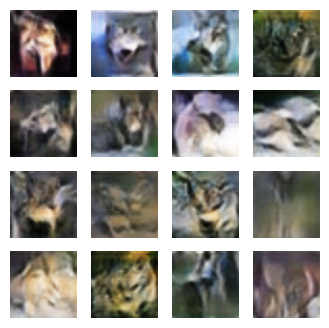

3550 [D loss: 0.06966246664524078, real acc.: 98.07691955566406%] [G loss: 9.727526664733887, fake acc.: 96.875%]


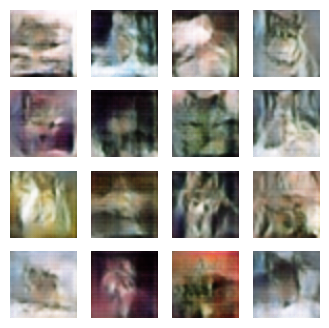

3600 [D loss: 0.0935305804014206, real acc.: 96.15384674072266%] [G loss: 18.086910247802734, fake acc.: 100.0%]


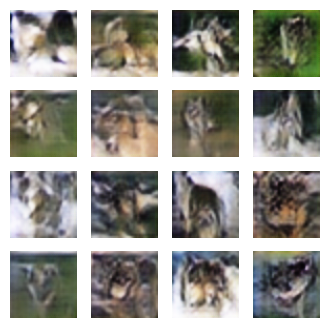

3650 [D loss: 0.00596341397613287, real acc.: 100.0%] [G loss: 12.78093147277832, fake acc.: 100.0%]


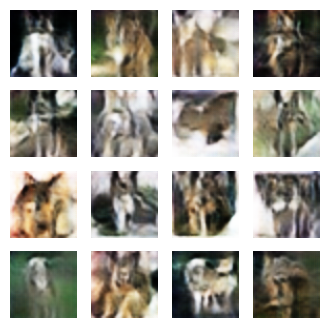

3700 [D loss: 0.004673917777836323, real acc.: 100.0%] [G loss: 10.604208946228027, fake acc.: 100.0%]


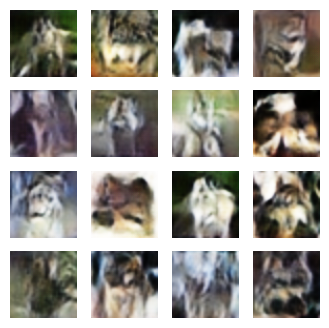

3750 [D loss: 0.0029739709571003914, real acc.: 100.0%] [G loss: 12.70873737335205, fake acc.: 100.0%]


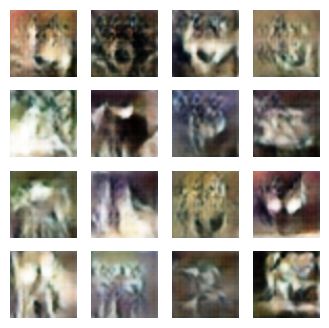

3800 [D loss: 0.008742349222302437, real acc.: 100.0%] [G loss: 11.290406227111816, fake acc.: 100.0%]


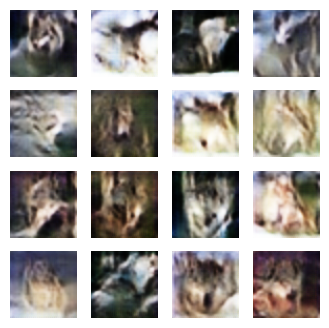

3850 [D loss: 0.0040011340752244, real acc.: 100.0%] [G loss: 11.743038177490234, fake acc.: 100.0%]


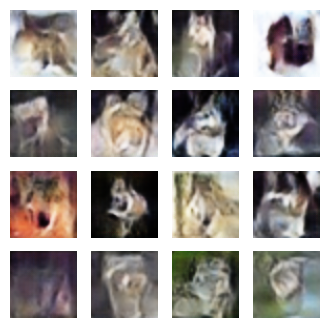

3900 [D loss: 0.002437860704958439, real acc.: 100.0%] [G loss: 11.019645690917969, fake acc.: 100.0%]


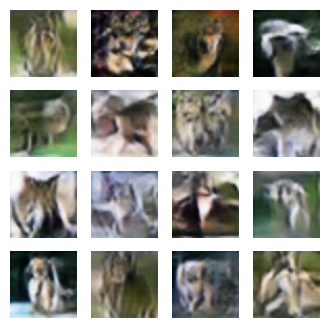

3950 [D loss: 0.0018507866188883781, real acc.: 100.0%] [G loss: 10.553086280822754, fake acc.: 100.0%]


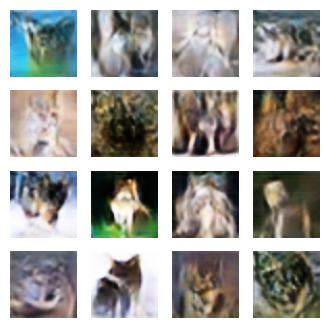

4000 [D loss: 0.0018120111199095845, real acc.: 100.0%] [G loss: 13.994781494140625, fake acc.: 100.0%]


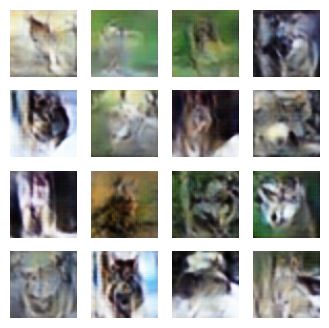

4050 [D loss: 0.14638294279575348, real acc.: 96.15384674072266%] [G loss: 11.204549789428711, fake acc.: 100.0%]


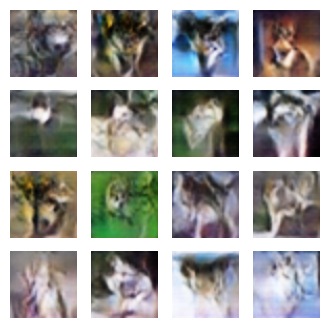

4100 [D loss: 0.0023716811556369066, real acc.: 100.0%] [G loss: 11.39007568359375, fake acc.: 100.0%]


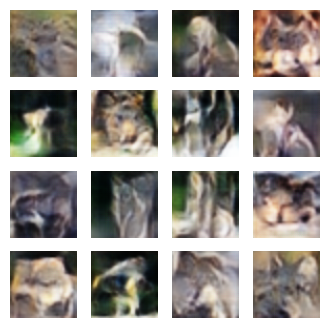

4150 [D loss: 0.000949770794250071, real acc.: 100.0%] [G loss: 12.478340148925781, fake acc.: 100.0%]


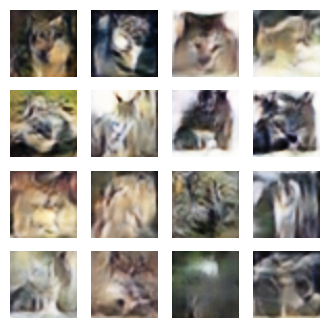

4200 [D loss: 0.0031784833408892155, real acc.: 100.0%] [G loss: 12.034317016601562, fake acc.: 100.0%]


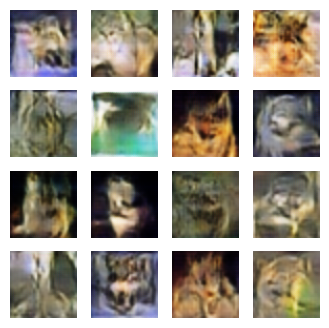

4250 [D loss: 0.00042184704216197133, real acc.: 100.0%] [G loss: 14.495723724365234, fake acc.: 100.0%]


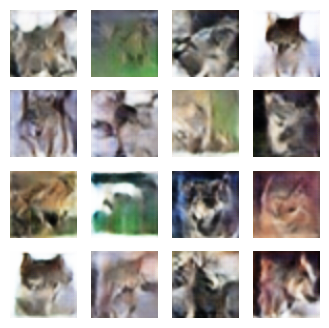

4300 [D loss: 0.003148585557937622, real acc.: 100.0%] [G loss: 14.916580200195312, fake acc.: 100.0%]


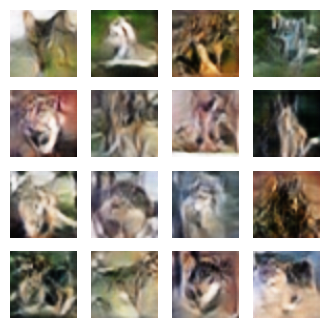

4350 [D loss: 0.0045339553616940975, real acc.: 100.0%] [G loss: 9.558917999267578, fake acc.: 100.0%]


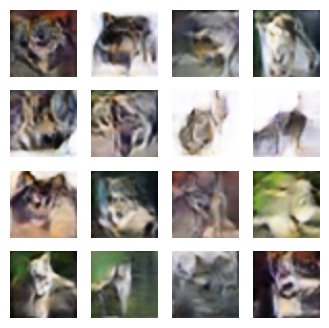

4400 [D loss: 0.0065506515093147755, real acc.: 100.0%] [G loss: 8.953079223632812, fake acc.: 100.0%]


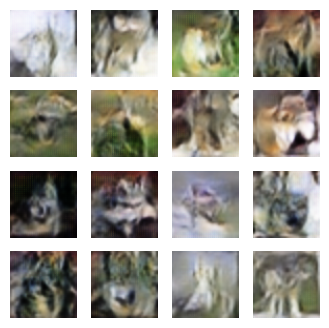

4450 [D loss: 0.01098452229052782, real acc.: 100.0%] [G loss: 8.264457702636719, fake acc.: 100.0%]


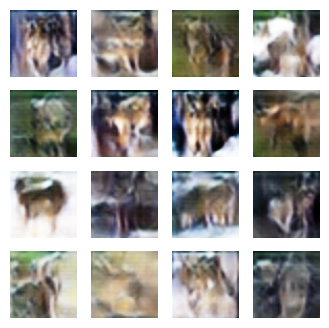

4500 [D loss: 0.13990606367588043, real acc.: 96.15384674072266%] [G loss: 9.677543640136719, fake acc.: 100.0%]


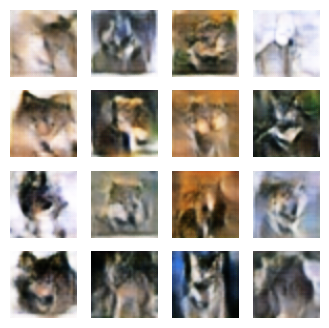

4550 [D loss: 0.04422842711210251, real acc.: 98.07691955566406%] [G loss: 12.785345077514648, fake acc.: 100.0%]


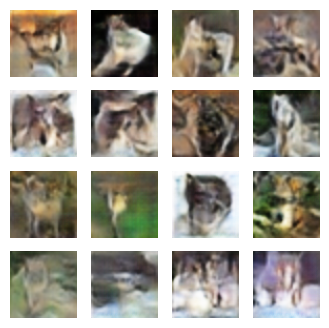

4600 [D loss: 0.018688825890421867, real acc.: 98.07691955566406%] [G loss: 13.23349666595459, fake acc.: 100.0%]


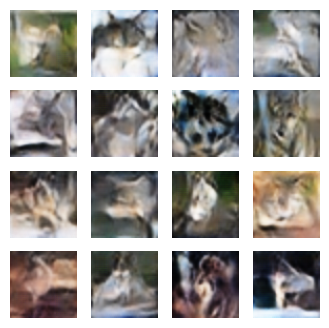

4650 [D loss: 0.011175127699971199, real acc.: 100.0%] [G loss: 13.727869033813477, fake acc.: 100.0%]


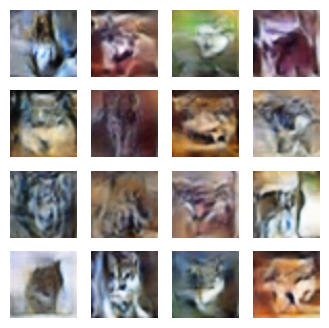

4700 [D loss: 0.019358377903699875, real acc.: 100.0%] [G loss: 13.39803409576416, fake acc.: 98.4375%]


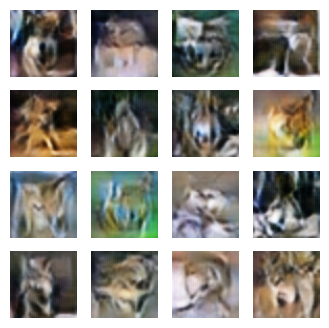

4750 [D loss: 0.3195301294326782, real acc.: 90.38461303710938%] [G loss: 17.291088104248047, fake acc.: 100.0%]


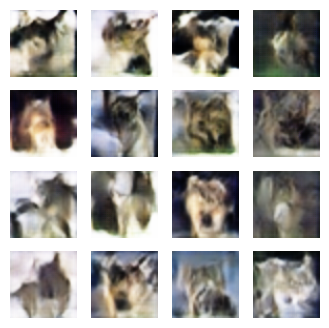

4800 [D loss: 0.0021008369512856007, real acc.: 100.0%] [G loss: 11.729708671569824, fake acc.: 100.0%]


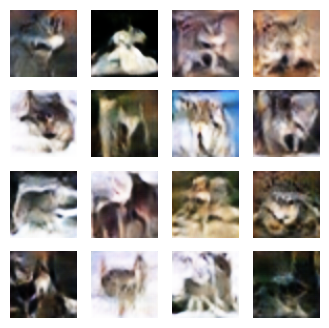

4850 [D loss: 0.00017924779967870563, real acc.: 100.0%] [G loss: 13.705219268798828, fake acc.: 100.0%]


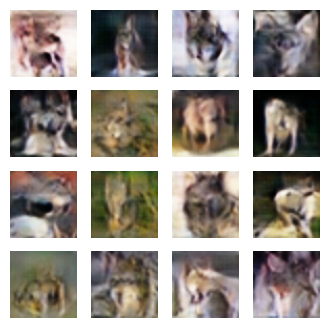

4900 [D loss: 0.0031079421751201153, real acc.: 100.0%] [G loss: 18.141990661621094, fake acc.: 100.0%]


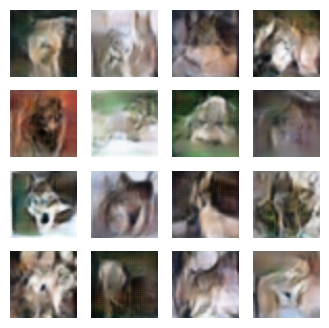

4950 [D loss: 0.01832975074648857, real acc.: 100.0%] [G loss: 10.802688598632812, fake acc.: 98.4375%]


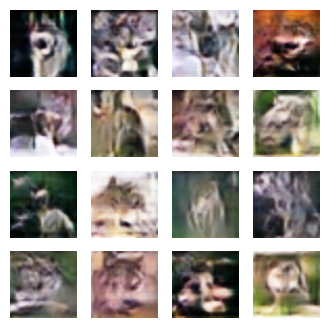

5000 [D loss: 0.004318344872444868, real acc.: 100.0%] [G loss: 15.608818054199219, fake acc.: 100.0%]


In [6]:

    losses = []
    accuracies = []
    iteration_checkpoints = []
    ITERATIONS = 5000
    batch_size = 64
    sample_interval = 50
    BUFFER_SIZE = 1500 

    def trainMain():
        
        train_dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(BUFFER_SIZE).batch(batch_size)
        #train(train_dataset, ITERATIONS)
        totalTime = time.time()
        for epoch in range(ITERATIONS):
            start = time.time()
            g_loss,d_loss = 0,0 #初期化
            for image_batch in train_dataset:
                g_loss,d_loss, real_accuracy, fake_accuracy = gan.train_step(image_batch,batch_size)
    
            #sample_interval回ごと記録
            if (epoch + 1) % sample_interval == 0:
                losses.append((d_loss, g_loss))
                accuracies.append((real_accuracy, fake_accuracy))
                
                iu.sampleImages(gan.generator,zdim,epoch+1)
                print(f"{epoch + 1} [D loss: {d_loss}, real acc.: {100.0 * real_accuracy}%] [G loss: {g_loss}, fake acc.: {100.0 * fake_accuracy}%]")

            #print ('epoch:{} is {} sec (total time:{})'.format(epoch + 1, time.time()-start,time.time() - totalTime))
        gan.save_weights("./",ITERATIONS)
    trainMain()


In [7]:
#gan.save_weights("./",500)

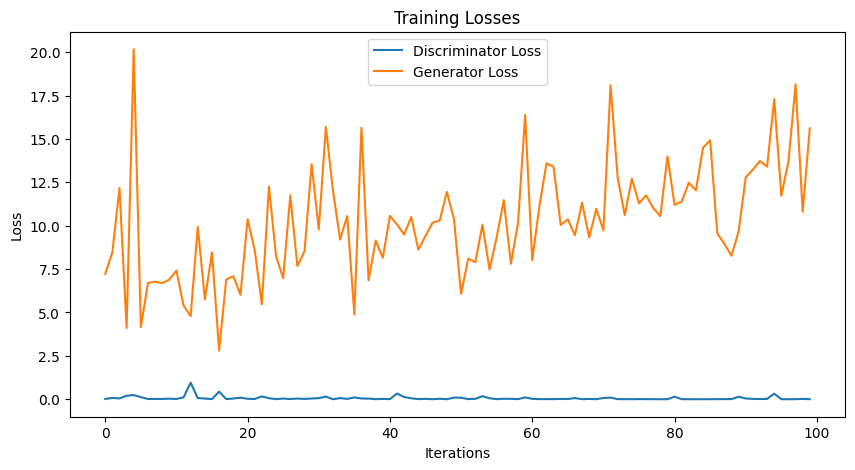

In [8]:
def plotResult(losses):
    discriminator_losses = [v[0] for v in losses]
    generator_losses = [v[1] for v in losses]

    plt.figure(figsize=(10, 5))
    plt.plot(discriminator_losses, label="Discriminator Loss")
    plt.plot(generator_losses, label="Generator Loss")
    plt.title("Training Losses")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

plotResult(losses)

In [ ]:
ｐｃ

In [9]:
#グリッドサーチで以下を調整してみる
#dropout
#学習率
#次元数
#バッチサイズ
dropout_rates = [0.1,0.2,0.3, 0.4, 0.5]
learning_rates = [1e-4,5e-4, 1e-5,5e-5, 1e-6,5e-6]
batch_sizes = [32, 64, 128,256]
opts = ['Adam','SGD']
losses = []
accuracies = []
# iteration_checkpoints = []
ITERATIONS_GRID = 500
# batch_size = 64
# sample_interval = 1000
# BUFFER_SIZE = 1500 #画像数は1363なので
results = []

In [10]:
import itertools
from tensorflow.keras.optimizers import Adam,SGD

def search():
    imageSize = 32
    zdim = 32
    iu = ImageUtil(image_size=imageSize)
    X_train = iu.loadDataset()
    
    trial = 0
    for dropout_rate, learning_rate, batch_size,opt in itertools.product(dropout_rates, learning_rates, batch_sizes,opts):
        start = time.time()
        trial += 1
        print ('No.{} optimizer:{} learning_rate:{} dropout_rate:{} batch_size:{}'.format(trial,opt,learning_rate,dropout_rate, batch_size))
        
        # オプティマイザの初期化
        if opt == 'Adam':
            generator_optimizer = Adam(learning_rate=learning_rate)
            discriminator_optimizer = Adam(learning_rate=learning_rate)
        elif opt == 'SGD':
            generator_optimizer = SGD(learning_rate=learning_rate)
            discriminator_optimizer = SGD(learning_rate=learning_rate)
    
        # DCGANモデルの初期化
        dcgan = DCGAN(image_size=imageSize, dimension=zdim,dropout_rate=dropout_rate)
        dcgan.generator_optimizer = generator_optimizer
        dcgan.discriminator_optimizer = discriminator_optimizer
        #dcgan.showSummary()
        
        train_dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(BUFFER_SIZE).batch(batch_size)
        #train(train_dataset, ITERATIONS)
        for epoch in range(ITERATIONS_GRID):
            losses = [] #reset
            
            g_loss,d_loss = 0,0 #初期化
            for image_batch in train_dataset:
                g_loss,d_loss, real_accuracy, fake_accuracy = gan.train_step(image_batch,batch_size)
        
            #sample_interval回ごと記録
            if (epoch + 1) % sample_interval == 0:
                losses.append((d_loss, g_loss))
                accuracies.append((real_accuracy, fake_accuracy))
                
                iu.sampleImages(gan.generator,zdim,epoch+1)
                print(f"{epoch + 1} [D loss: {d_loss}, real acc.: {100.0 * real_accuracy}%] [G loss: {g_loss}, fake acc.: {100.0 * fake_accuracy}%]")
        
    
        tmp = {
                'learning_rate': learning_rate,
                'batch_size': batch_size,
                # 'optimizer': optimizer_choice,
                # 'dimension': dimension,
                'losses': losses
            }
        print ('%d回目 each itertools.product Time {} is {} sec'.format(trial,epoch + 1, time.time()-start))
        print(tmp)
        # 結果の保存
        results.append(tmp)
    
    #最適
    best_trial = min(results, key=lambda x: min(x['losses']))
    print("結果",best_trial)
    

#通常時に実行しないように
#search()

